In [1]:
# importing necessary libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import re
%matplotlib inline
import warnings

from pandas.api.types import is_numeric_dtype, is_float_dtype
import matplotlib.style as style

pd.set_option('display.float_format', lambda x: '%2f' %x)
pd.options.display.max_columns = None

warnings.filterwarnings('ignore')
from datetime import datetime as dt

In [2]:
df = pd.read_csv('Energy_and_Water_Data_Disclosure_for_Local_Law_84_2017__Data_for_Calendar_Year_2016_.csv')

# EDA

In [3]:
df.head(5)

,Order,Property Id,Property Name,Parent Property Id,Parent Property Name,BBL - 10 digits,"NYC Borough, Block and Lot (BBL) self-reported",NYC Building Identification Number (BIN),Address 1 (self-reported),Address 2,Postal Code,Street Number,Street Name,Borough,DOF Gross Floor Area,Primary Property Type - Self Selected,List of All Property Use Types at Property,Largest Property Use Type,Largest Property Use Type - Gross Floor Area (ft²),2nd Largest Property Use Type,2nd Largest Property Use - Gross Floor Area (ft²),3rd Largest Property Use Type,3rd Largest Property Use Type - Gross Floor Area (ft²),Year Built,Number of Buildings - Self-reported,Occupancy,Metered Areas (Energy),Metered Areas (Water),ENERGY STAR Score,Site EUI (kBtu/ft²),Weather Normalized Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Weather Normalized Source EUI (kBtu/ft²),Fuel Oil #1 Use (kBtu),Fuel Oil #2 Use (kBtu),Fuel Oil #4 Use (kBtu),Fuel Oil #5 & 6 Use (kBtu),Diesel #2 Use (kBtu),District Steam Use (kBtu),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Property GFA - Self-Reported (ft²),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Release Date,Water Required?,DOF Benchmarking Submission Status,Latitude,Longitude,Community Board,Council District,Census Tract,NTA
0,1,13286,201/205,13286,201/205,1013160001,1013160001,1037549,201/205 East 42nd st.,Not Available,10017,675,3 AVENUE,Manhattan,289356.000000,Office,Office,Office,293447,Not Available,Not Available,Not Available,Not Available,1963,2,100,Whole Building,Not Available,Not Available,305.6,303.1,37.8,Not Available,614.2,Not Available,Not Available,Not Available,Not Available,Not Available,5.15506751E7,Not Available,Not Available,38139374.2,1.10827705E7,6962.2,0,6962.2,762051,Not Available,Not Available,619.4,05/01/2017 05:32:03 PM,No,In Compliance,40.750791,-73.973963,6.000000,4.000000,88.000000,Turtle Bay-East Midtown ...
1,2,28400,NYP Columbia (West Campus),28400,NYP Columbia (West Campus),1021380040,1-02138-0040,1084198; 1084387;1084385; 1084386; 1084388; 10...,622 168th Street,Not Available,10032,180,FT WASHINGTON AVENUE,Manhattan,3693539.000000,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),3889181,Not Available,Not Available,Not Available,Not Available,1969,12,100,Whole Building,Whole Building,55,229.8,228.8,24.8,2.4,401.1,Not Available,1.96248472E7,Not Available,Not Available,Not Available,-3.914148026E8,933073441,9330734.4,332365924,9.62613121E7,55870.4,51016.4,4854.1,3889181,Not Available,Not Available,404.3,04/27/2017 11:23:27 AM,No,In Compliance,40.841402,-73.942568,12.000000,10.000000,251.000000,Washington Heights South ...
2,3,4778226,MSCHoNY North,28400,NYP Columbia (West Campus),1021380030,1-02138-0030,1063380,3975 Broadway,Not Available,10032,3975,BROADWAY,Manhattan,152765.000000,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),231342,Not Available,Not Available,Not Available,Not Available,1924,1,100,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,0,0,0,231342,Not Available,Not Available,Not Available,04/27/2017 11:23:27 AM,No,In Compliance,40.840427,-73.940249,12.000000,10.000000,251.000000,Washington Heights South ...
3,4,4778267,Herbert Irving Pavilion & Millstein Hospital,28400,NYP Columbia (West Campus),1021390001,1-02139-0001,1087281; 1076746,161 Fort Washington Ave,177 Fort Washingt

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11746 entries, 0 to 11745
Data columns (total 60 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Order                                                       11746 non-null  int64  
 1   Property Id                                                 11746 non-null  int64  
 2   Property Name                                               11746 non-null  object 
 3   Parent Property Id                                          11746 non-null  object 
 4   Parent Property Name                                        11746 non-null  object 
 5   BBL - 10 digits                                             11735 non-null  object 
 6   NYC Borough, Block and Lot (BBL) self-reported              11746 non-null  object 
 7   NYC Building Identification Number (BIN)                    11746 non-null  object 
 

***Notes:***
- There are many values shown as Not available. Need to convert them to Null values.
- Many numerical values are in form of object. 

In [5]:
df.shape

(11746, 60)

In [6]:
# unique features in all columns
for i in df.columns:
    print(f'There are {df[i].nunique()} number of unique values in feature: {i}')
    print('-'*125)

There are 11746 number of unique values in feature: Order
-----------------------------------------------------------------------------------------------------------------------------
There are 11746 number of unique values in feature: Property Id
-----------------------------------------------------------------------------------------------------------------------------
There are 11740 number of unique values in feature: Property Name
-----------------------------------------------------------------------------------------------------------------------------
There are 102 number of unique values in feature: Parent Property Id
-----------------------------------------------------------------------------------------------------------------------------
There are 103 number of unique values in feature: Parent Property Name
-----------------------------------------------------------------------------------------------------------------------------
There are 11580 number of unique values in

###### But before all this lets begin by dropping columns which have large number of unique values and won't have any contribution for prediction based on the data field desciption.

# Data Cleaning

In [7]:
df.drop(columns=['Order','Property Id','Property Name','Parent Property Name','Parent Property Id','BBL - 10 digits',
   'Address 1 (self-reported)','Address 2','Release Date','Postal Code','Street Name', 'Street Number','Latitude','Longitude',
                 'NYC Building Identification Number (BIN)','NYC Borough, Block and Lot (BBL) self-reported',
                'NTA','List of All Property Use Types at Property',
                 'Community Board', 'Council District','Census Tract'],inplace=True)

- ***Order, Property Id, Property Name, Parent Property Name, Parent Property Id, BBL - 10 digits, Address 1 (self-reported, Address 2, Postal Code, Street Name, Street Number, Latitude, Longitude, NYC Building Identification Number (BIN, NYC Borough, Block and Lot (BBL) self-reported***- Too many unique values
    
- ***Release Date*** - Date when the submission was relesaed through the City's Portfolio Manage template. Redundant information. 
- ***List of All Property Use Types at Property*** has complete list of all properties of that site. Redundant information
- ***Council district, Community Board,***NTA*** and Census Tract***values are categorical values. But since there are large number of unique values. It will be better to drop it.

In [8]:
df.shape

(11746, 39)

###### Our aim is to predict the score. Instances where the target variable is Not Available we will drop.

In [9]:
df = df[df['ENERGY STAR Score'] != 'Not Available']

In [10]:
# many cells have values 'Not avialbale', will replace that 'Not available' with Null values
df = df.replace({'Not Available':np.nan})

In [11]:
df.head(2)

,Borough,DOF Gross Floor Area,Primary Property Type - Self Selected,Largest Property Use Type,Largest Property Use Type - Gross Floor Area (ft²),2nd Largest Property Use Type,2nd Largest Property Use - Gross Floor Area (ft²),3rd Largest Property Use Type,3rd Largest Property Use Type - Gross Floor Area (ft²),Year Built,Number of Buildings - Self-reported,Occupancy,Metered Areas (Energy),Metered Areas (Water),ENERGY STAR Score,Site EUI (kBtu/ft²),Weather Normalized Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Weather Normalized Source EUI (kBtu/ft²),Fuel Oil #1 Use (kBtu),Fuel Oil #2 Use (kBtu),Fuel Oil #4 Use (kBtu),Fuel Oil #5 & 6 Use (kBtu),Diesel #2 Use (kBtu),District Steam Use (kBtu),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Property GFA - Self-Reported (ft²),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Water Required?,DOF Benchmarking Submission Status
1,Manhattan,3693539.000000,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),3889181,NaN,NaN,NaN,NaN,1969,12,100,Whole Building,Whole Building,55,229.8,228.8,24.8,2.4,401.1,NaN,1.96248472E7,NaN,NaN,NaN,-3.914148026E8,933073441,9330734.4,332365924,9.62613121E7,55870.4,51016.4,4854.1,3889181,NaN,NaN,404.3,No,In Compliance
5,Manhattan,2230742.000000,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),2971874,NaN,NaN,NaN,NaN,1932,12,100,Whole Building,Whole Building,55,359.9,359,8.3,4.8,411.5,NaN,2.00832154E7,NaN,NaN,NaN,-4.690796909E8,1.4322508769E9,1.43225088E7,86335350.5,2.45508594E7,54429.8,77564.1,-23134.3,2971874,NaN,NaN,414.2,No,In Compliance


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9642 entries, 1 to 11745
Data columns (total 39 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Borough                                                     9579 non-null   object 
 1   DOF Gross Floor Area                                        9579 non-null   float64
 2   Primary Property Type - Self Selected                       9642 non-null   object 
 3   Largest Property Use Type                                   9642 non-null   object 
 4   Largest Property Use Type - Gross Floor Area (ft²)          9642 non-null   object 
 5   2nd Largest Property Use Type                               2379 non-null   object 
 6   2nd Largest Property Use - Gross Floor Area (ft²)           2379 non-null   object 
 7   3rd Largest Property Use Type                               774 non-null    object 
 8

###### Before converting numerical features lets check missing values and drop features which have more than 60% data missing. 

### Missing Data Check

In [13]:
#missing data count function
def missing_count(df):
    total = df.isnull().sum().sort_values(ascending=False)
    percent = round((df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)*100,2)
    missing_data = pd.concat([total[total>0], percent[percent>0]], axis=1, keys=['Total', 'Percent'])
    return missing_data

In [14]:
missing_data = missing_count(df)

In [15]:
missing_data

,Total,Percent
Fuel Oil #1 Use (kBtu),9633,99.910000
Diesel #2 Use (kBtu),9631,99.890000
Fuel Oil #5 & 6 Use (kBtu),9211,95.530000
District Steam Use (kBtu),8884,92.140000
3rd Largest Property Use Type,8868,91.970000
3rd Largest Property Use Type - Gross Floor Area (ft²),8868,91.970000
Fuel Oil #4 Use (kBtu),8544,88.610000
Fuel Oil #2 Use (kBtu),7486,77.640000
2nd Largest Property Use Type,7263,75.330000
2nd Largest Property Use - Gross Floor Area (ft²),7263,75.330000


In [16]:
df.shape

(9642, 39)

In [17]:
# dropping columns with 60% and more missing data
df.drop(columns=missing_data[missing_data['Percent']>=60].index,inplace=True)

In [18]:
df.shape

(9642, 29)

In [19]:
missing_data = missing_count(df)
missing_data

,Total,Percent
Metered Areas (Water),3741,38.800000
Water Intensity (All Water Sources) (gal/ft²),3114,32.300000
Water Use (All Water Sources) (kgal),3114,32.300000
Weather Normalized Site Natural Gas Intensity (therms/ft²),1413,14.650000
Weather Normalized Site Natural Gas Use (therms),1413,14.650000
Weather Normalized Source EUI (kBtu/ft²),1098,11.390000
Weather Normalized Site EUI (kBtu/ft²),1098,11.390000
Natural Gas Use (kBtu),1002,10.390000
Weather Normalized Site Electricity Intensity (kWh/ft²),492,5.100000
Weather Normalized Site Electricity (kWh),492,5.100000


In [20]:
# renaming energy star score column
df.rename(columns={'ENERGY STAR Score':'score'},inplace=True)

In [21]:
# function to segregate numerical and categorical columns
col_num = []
col_cate = []
def col_distinguisher(df):
    col_num[:] = []
    col_cate[:] = []

    # regular expression pattern to match float
    float_pattern = r'^[-+]?[0-9]*\.?[0-9]+([eE][-+]?[0-9]+)?$'

    for col in df.columns:
        if df[col].apply(lambda x: bool(re.match(float_pattern, str(x)))).any():
            col_num.append(col)
        else:
            col_cate.append(col)

    print(f'There are total {len(col_num)} numerical columns.\n',col_num)
    print('-'*125)
    print(f'There are total {len(col_cate)} categorical columns.\n',col_cate)

In [22]:
col_distinguisher(df)

There are total 22 numerical columns.
 ['DOF Gross Floor Area', 'Largest Property Use Type - Gross Floor Area (ft²)', 'Year Built', 'Number of Buildings - Self-reported', 'Occupancy', 'score', 'Site EUI (kBtu/ft²)', 'Weather Normalized Site EUI (kBtu/ft²)', 'Weather Normalized Site Electricity Intensity (kWh/ft²)', 'Weather Normalized Site Natural Gas Intensity (therms/ft²)', 'Weather Normalized Source EUI (kBtu/ft²)', 'Natural Gas Use (kBtu)', 'Weather Normalized Site Natural Gas Use (therms)', 'Electricity Use - Grid Purchase (kBtu)', 'Weather Normalized Site Electricity (kWh)', 'Total GHG Emissions (Metric Tons CO2e)', 'Direct GHG Emissions (Metric Tons CO2e)', 'Indirect GHG Emissions (Metric Tons CO2e)', 'Property GFA - Self-Reported (ft²)', 'Water Use (All Water Sources) (kgal)', 'Water Intensity (All Water Sources) (gal/ft²)', 'Source EUI (kBtu/ft²)']
-----------------------------------------------------------------------------------------------------------------------------
Ther

In [23]:
# converting object to numerical features
df[col_num] = df[col_num].apply(lambda x: pd.to_numeric(x,errors='coerce'))

In [24]:
df.head(2)

,Borough,DOF Gross Floor Area,Primary Property Type - Self Selected,Largest Property Use Type,Largest Property Use Type - Gross Floor Area (ft²),Year Built,Number of Buildings - Self-reported,Occupancy,Metered Areas (Energy),Metered Areas (Water),score,Site EUI (kBtu/ft²),Weather Normalized Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Weather Normalized Source EUI (kBtu/ft²),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Property GFA - Self-Reported (ft²),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Water Required?,DOF Benchmarking Submission Status
1,Manhattan,3693539.000000,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),3889181.000000,1969,12,100,Whole Building,Whole Building,55,229.800000,228.800000,24.800000,2.400000,401.100000,933073441.000000,9330734.400000,332365924.000000,96261312.100000,55870.400000,51016.400000,4854.100000,3889181,NaN,NaN,404.300000,No,In Compliance
5,Manhattan,2230742.000000,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),2971874.000000,1932,12,100,Whole Building,Whole Building,55,359.900000,359.000000,8.300000,4.800000,411.500000,1432250876.900000,14322508.800000,86335350.500000,24550859.400000,54429.800000,77564.100000,-23134.300000,2971874,NaN,NaN,414.200000,No,In Compliance


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9642 entries, 1 to 11745
Data columns (total 29 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Borough                                                     9579 non-null   object 
 1   DOF Gross Floor Area                                        9579 non-null   float64
 2   Primary Property Type - Self Selected                       9642 non-null   object 
 3   Largest Property Use Type                                   9642 non-null   object 
 4   Largest Property Use Type - Gross Floor Area (ft²)          9642 non-null   float64
 5   Year Built                                                  9642 non-null   int64  
 6   Number of Buildings - Self-reported                         9642 non-null   int64  
 7   Occupancy                                                   9642 non-null   int64  
 8

###### We have converted required features to numeric dtype. 

In [26]:
df.describe()

,DOF Gross Floor Area,Largest Property Use Type - Gross Floor Area (ft²),Year Built,Number of Buildings - Self-reported,Occupancy,score,Site EUI (kBtu/ft²),Weather Normalized Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Weather Normalized Source EUI (kBtu/ft²),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Property GFA - Self-Reported (ft²),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²)
count,9579.000000,9642.000000,9642.000000,9642.000000,9642.000000,9642.000000,9642.000000,8544.000000,9150.000000,8229.000000,8544.000000,8640.000000,8229.000000,9565.000000,9150.000000,9639.000000,9629.000000,9633.000000,9642.000000,6528.000000,6528.000000,9642.000000
mean,164598.148867,157391.126799,1948.453537,1.284173,99.033914,59.854594,235.663711,260.673467,9.523617,1.655013,351.486248,12662538.531296,138309.152522,5714179.474522,1688588.454426,2284.570640,714.035580,1572.269407,162366.866107,14798.577696,108.211494,326.337949
std,302845.587052,286475.996062,30.059512,3.953959,5.569673,29.993586,9034.569471,10339.147155,98.071585,103.545717,10960.245148,532708537.050932,5897389.824221,32639317.046074,9699950.160698,58443.176438,26805.295300,51970.586537,294173.452489,118098.392141,687.090187,9609.746685
min,50028.000000,3190.000000,1600.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-23134.300000,120.000000,0.000000,0.000000,0.000000
25%,65008.000000,65780.250000,1927.000000,1.000000,100.000000,37.000000,62.925000,66.300000,3.800000,0.100000,104.100000,1237477.975000,13040.600000,1020828.200000,295474.750000,335.400000,169.300000,94.000000,66917.250000,2812.000000,29.370000,100.100000
50%,91280.000000,90641.500000,1941.000000,1.000000,100.000000,65.000000,78.900000,82.900000,5.100000,0.500000,128.800000,4206698.150000,45380.700000,1771008.800000,516386.650000,500.200000,280.500000,164.900000,92584.000000,4874.700000,47.190000,124.400000
75%,154648.000000,150194.750000,1965.000000,1.000000,100.000000,85.000000,97.200000,102.200000,8.700000,0.700000,165.000000,6840574.050000,73422.200000,4110571.300000,1203703.850000,890.750000,447.900000,400.400000,154000.000000,8061.075000,73.175000,160.100000
max,13540113.000000,14217119.000000,2019.000000,155.000000,100.000000,100.000000,869265.000000,939329.000000,5304.400000,9393.000000,986366.000000,49459193300.000000,534458968.800000,1691763071.000000,495827334.500000,4764455.600000,2627015.000000,4764375.000000,14217119.000000,3491537.700000,21689.360000,912801.100000


###### Looks like some serious outliers are present in dataset.

### Zero variance check

In [27]:
df.nunique()[df.nunique()==1]

DOF Benchmarking Submission Status    1
dtype: int64

###### Only one column having no variance. We will drop it. 

In [28]:
df.drop(columns=['DOF Benchmarking Submission Status'],inplace=True)

### Distribution check

<AxesSubplot:xlabel='score', ylabel='Density'>

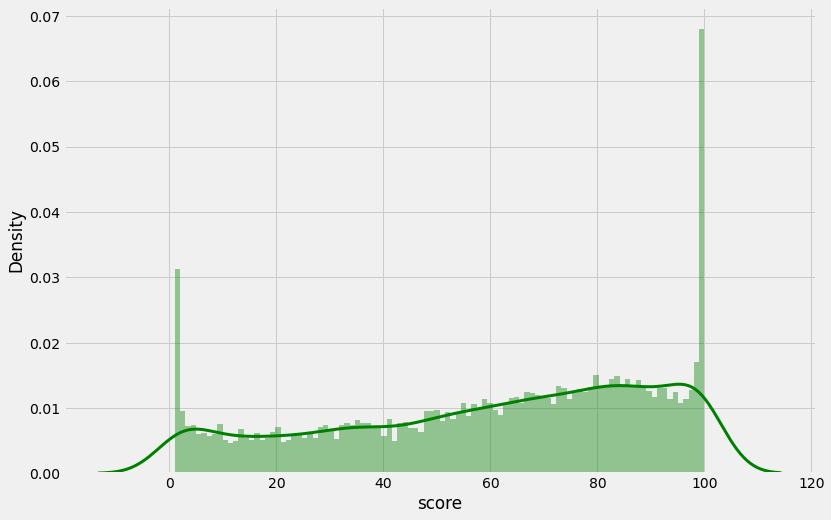

In [29]:
# checking distribution of target variable
style.use('fivethirtyeight')
sns.set_palette("muted")
plt.figure(figsize=(12,8))
sns.distplot(df.score,color='g',kde_kws={'lw':3},bins=100)

***Observation:***
- The distribution is slightly negatively skewed.
- Many building have rating 100 and 0. It would interesting to see which buildings are these, their type, area, boroughs. Lets check.

In [30]:
# score_qcuts = pd.qcut(df['score'],4,['Worst','Okay','Average','Best'])

In [31]:
col_distinguisher(df)

There are total 22 numerical columns.
 ['DOF Gross Floor Area', 'Largest Property Use Type - Gross Floor Area (ft²)', 'Year Built', 'Number of Buildings - Self-reported', 'Occupancy', 'score', 'Site EUI (kBtu/ft²)', 'Weather Normalized Site EUI (kBtu/ft²)', 'Weather Normalized Site Electricity Intensity (kWh/ft²)', 'Weather Normalized Site Natural Gas Intensity (therms/ft²)', 'Weather Normalized Source EUI (kBtu/ft²)', 'Natural Gas Use (kBtu)', 'Weather Normalized Site Natural Gas Use (therms)', 'Electricity Use - Grid Purchase (kBtu)', 'Weather Normalized Site Electricity (kWh)', 'Total GHG Emissions (Metric Tons CO2e)', 'Direct GHG Emissions (Metric Tons CO2e)', 'Indirect GHG Emissions (Metric Tons CO2e)', 'Property GFA - Self-Reported (ft²)', 'Water Use (All Water Sources) (kgal)', 'Water Intensity (All Water Sources) (gal/ft²)', 'Source EUI (kBtu/ft²)']
-----------------------------------------------------------------------------------------------------------------------------
Ther

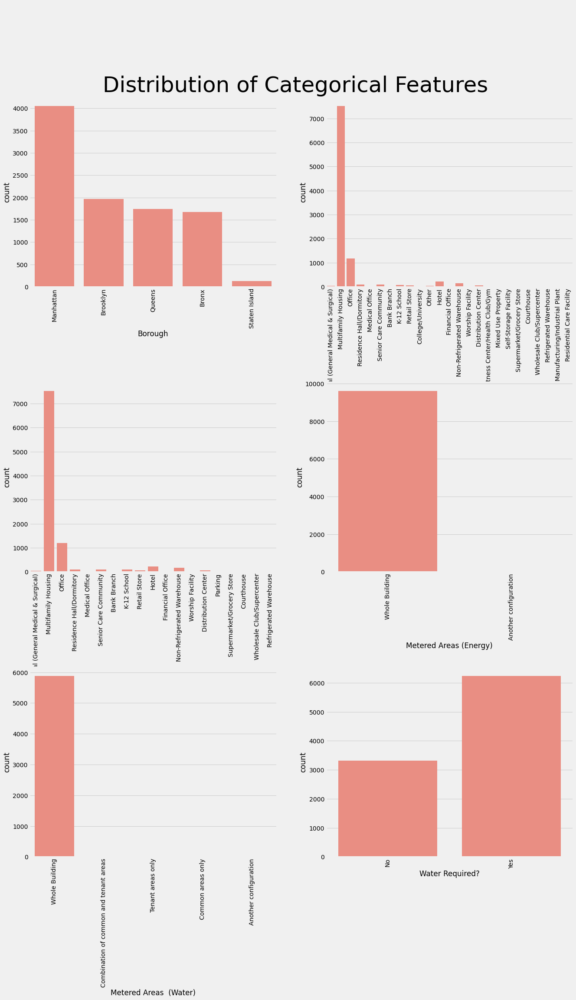

In [32]:
# plotting distribution of categorical feature
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20,30))
fig.subplots_adjust(hspace=0.5)
fig.suptitle('\n\n\n Distribution of Categorical Features',fontsize=50)

for ax, col in zip(axes.flatten(), col_cate):
    figur = sns.countplot(df[col], ax=ax,color='salmon')
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

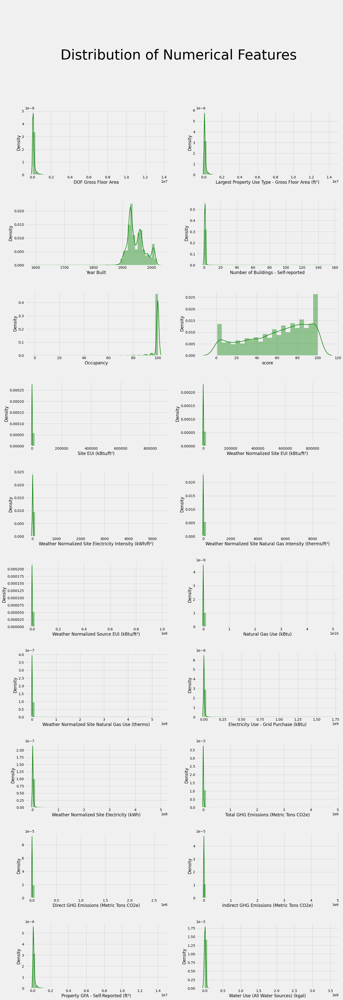

In [33]:
# plotting distribution of numerical features
fig, axes = plt.subplots(nrows=10, ncols=2, figsize=(20,60))
fig.subplots_adjust(hspace=0.4)
fig.suptitle('\n\n\n Distribution of Numerical Features',fontsize=55)

for ax, col in zip(axes.flatten(), col_num):
    figur = sns.distplot(a=df[col], ax=ax,color='g',kde_kws={'lw':2})

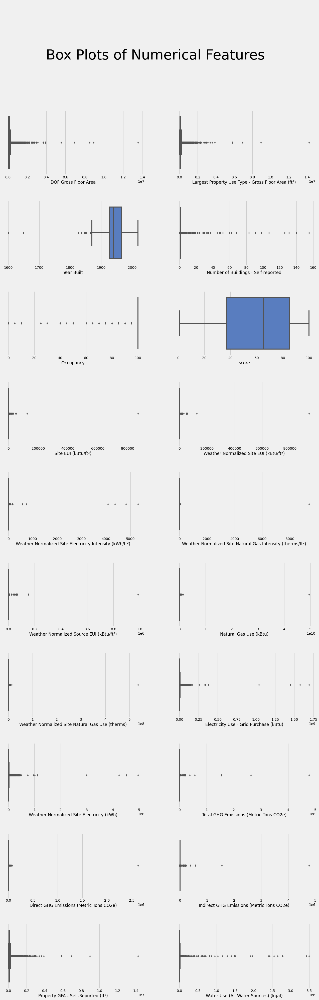

In [34]:
# plotting box plot of numerical features
fig, axes = plt.subplots(nrows=10, ncols=2, figsize=(20,60))
fig.subplots_adjust(hspace=0.4)
fig.suptitle('\n\n\n Box Plots of Numerical Features',fontsize=55)

for ax, col in zip(axes.flatten(), col_num):
    figur = sns.boxplot(df[col], ax=ax)

***Notes:***
Many features are highly skewed. There is a strong presence of outliters in dataset. We will need to treat it before proceeding.
Lets check correlation matrix and then the magnitude of skewness of features. 

### Correlation check

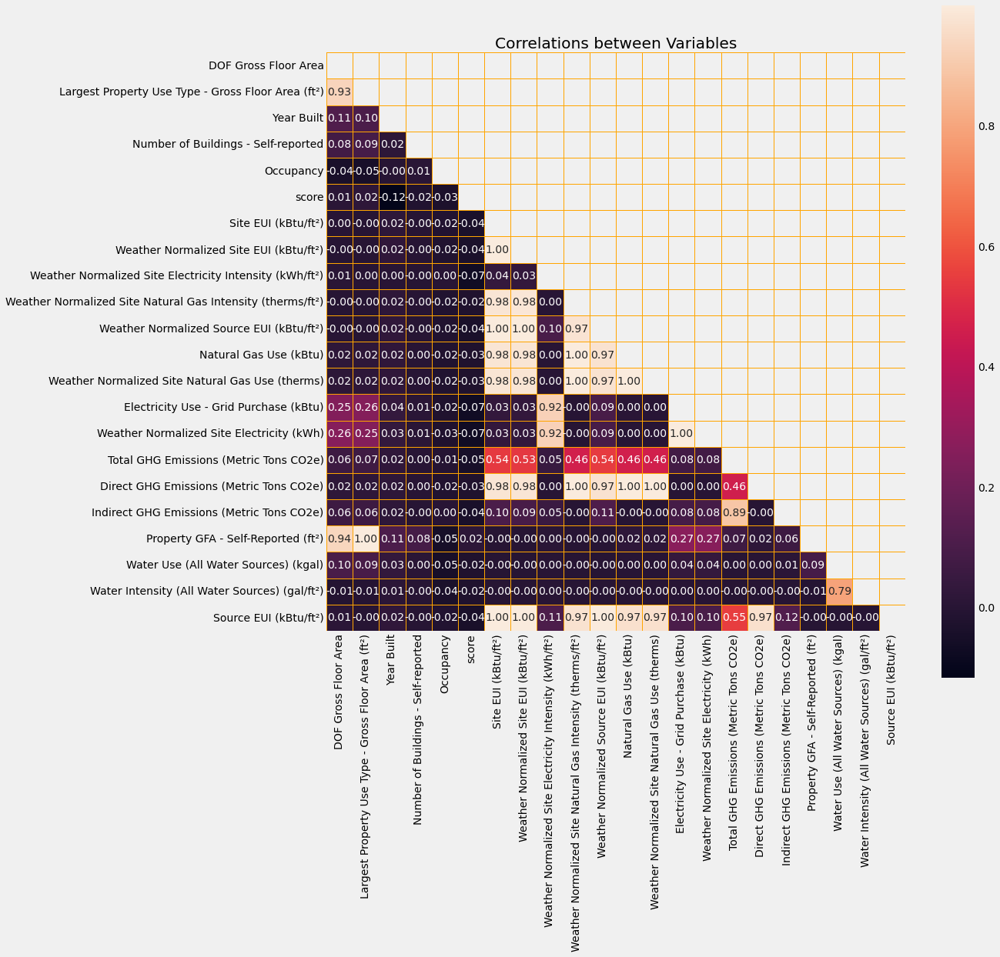

In [35]:
corr_df = df.corr()
f,ax=plt.subplots(figsize=(15,15))
mask = np.zeros_like(corr_df)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr_df,annot=True,fmt=".2f",ax=ax,linewidths=0.5,linecolor="orange", mask = mask, square=True)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.title('Correlations between Variables')
plt.show()

***Observation:***
- Multicolinearity exist between:
 - DOF Gross Floor Area --> Largest Property Use Type - Gross Floor Area (ft²) and Property GFA - Self-Reported (ft²).
 - Site EUI (kBtu/ft²) --> Source EUI (kBtu/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²), Weather Normalized Source EUI (kBtu/ft²) and Weather Normalized Site EUI (kBtu/ft²)
 - Electricity Use - Grid Purchase (kBtu) --> Weather Normalized Site Electricity (kWh)
 - Natural Gas Use (kBtu) --> Total GHG Emissions (Metric Tons CO2e) and Direct GHG Emissions (Metric Tons CO2e) and Weather Normalized Site Natural Gas Use (therms)
 - Water Use (All Water Sources) (kgal) --> Water Intensity (All Water Sources) (gal/ft²)
- There seems to be almost no correlation between energy star score and predictor variables. This is because of presence of heavy outliers in dataset.

In [36]:
multicolinear_columns = ['Weather Normalized Site EUI (kBtu/ft²)','Natural Gas Use (kBtu)',
                         'Weather Normalized Site Electricity (kWh)','Weather Normalized Site Natural Gas Use (therms)',
                         'Indirect GHG Emissions (Metric Tons CO2e)','Electricity Use - Grid Purchase (kBtu)',
                         'Weather Normalized Source EUI (kBtu/ft²)','Property GFA - Self-Reported (ft²)']

##### Lets check Skewness of features.

In [37]:
# skewness dictionary
skewness1 = {i:df[i].skew() for i in col_num}
# sort the dictionary by values
skewness1 = dict(sorted(skewness1.items(), key=lambda item: item[1],reverse=True))

In [38]:
skewness1

{'Direct GHG Emissions (Metric Tons CO2e)': 97.71220330099428,
 'Site EUI (kBtu/ft²)': 92.70483406721446,
 'Natural Gas Use (kBtu)': 92.59673008210896,
 'Weather Normalized Site Natural Gas Intensity (therms/ft²)': 90.6981792876366,
 'Weather Normalized Site Natural Gas Use (therms)': 90.41770954563549,
 'Source EUI (kBtu/ft²)': 89.44006405751415,
 'Weather Normalized Site EUI (kBtu/ft²)': 88.01188805842372,
 'Weather Normalized Source EUI (kBtu/ft²)': 85.7072449584997,
 'Indirect GHG Emissions (Metric Tons CO2e)': 82.88770824316765,
 'Total GHG Emissions (Metric Tons CO2e)': 67.62668553755167,
 'Weather Normalized Site Electricity Intensity (kWh/ft²)': 47.528138543378034,
 'Electricity Use - Grid Purchase (kBtu)': 39.03996769303006,
 'Weather Normalized Site Electricity (kWh)': 38.30636508632185,
 'Number of Buildings - Self-reported': 25.776690657607663,
 'Water Use (All Water Sources) (kgal)': 20.40951685020309,
 'Largest Property Use Type - Gross Floor Area (ft²)': 20.1116102347108

##### Lets treat outliers before proceeding ahead.

In [39]:
min1=[]
max1=[]
for i in col_num:

    first_quartile = df[i].describe()['25%']
    third_quartile = df[i].describe()['75%']

    # Interquartile range
    iqr = third_quartile - first_quartile

    # Remove outliers (we are considering factor 3 and not 1.5. This is because the data was highly skewed. Keeping factor
    # 1.5 can remove useful information )
    temp2 = df[(df[i] > (first_quartile - 3 * iqr)) &
                (df[i] < (third_quartile + 3 * iqr))]

    correlations_temp2 = temp2.corr()['score'].sort_values()

    min1.append((i,correlations_temp2[-2]))
    max1.append((i,correlations_temp2[0]))
max1 = dict(sorted(max1,key= lambda x: x[1]))
min1 = dict(sorted(min1,key= lambda x: x[-1]))

In [40]:
max1

{'Site EUI (kBtu/ft²)': -0.724528207786753,
 'Source EUI (kBtu/ft²)': -0.7239636315982582,
 'Weather Normalized Source EUI (kBtu/ft²)': -0.7209103051164901,
 'Weather Normalized Site EUI (kBtu/ft²)': -0.7189226004344723,
 'Total GHG Emissions (Metric Tons CO2e)': -0.65373229371777,
 'Electricity Use - Grid Purchase (kBtu)': -0.4005756145971751,
 'Indirect GHG Emissions (Metric Tons CO2e)': -0.400460492007179,
 'Weather Normalized Site Electricity (kWh)': -0.3999653817261589,
 'Weather Normalized Site Electricity Intensity (kWh/ft²)': -0.3558305071203487,
 'Weather Normalized Site Natural Gas Intensity (therms/ft²)': -0.3492921585524806,
 'Direct GHG Emissions (Metric Tons CO2e)': -0.3295251306284482,
 'Weather Normalized Site Natural Gas Use (therms)': -0.32477704515826317,
 'Natural Gas Use (kBtu)': -0.32419328331718106,
 'Water Intensity (All Water Sources) (gal/ft²)': -0.2327767380991492,
 'Water Use (All Water Sources) (kgal)': -0.2208366816949638,
 'Year Built': -0.119038244477735

###### Since Site EUI has strongest correlation with Energy score. We will remove outliers present in Site EUI.

In [41]:
df.shape

(9642, 28)

###### Before removing outliers lets split the data into train and test set

In [42]:
from sklearn.model_selection import train_test_split

In [43]:
df_copy = df.copy()

In [44]:
X = df.drop(columns='score')
y = df['score']

In [45]:
 X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [47]:
# working df. we will split the predictor and target later
df = pd.concat([X_train,y_train],axis=1)

### Removing Outliers

In [48]:
df.shape

(7713, 28)

<AxesSubplot:xlabel='Site EUI (kBtu/ft²)', ylabel='Density'>

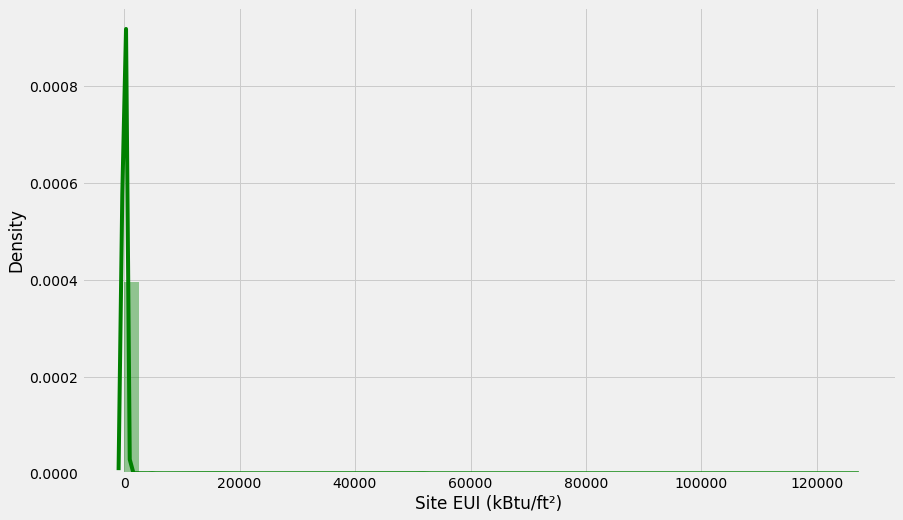

In [49]:
# Distribution Plot before removing outlier
plt.figure(figsize=(13,8))
sns.distplot(a=df['Site EUI (kBtu/ft²)'],color='g')

In [50]:
def outlier_removal(feature,dataframe):
    first_quartile = dataframe[feature].describe()['25%']
    third_quartile = dataframe[feature].describe()['75%']

    # Interquartile range
    iqr = third_quartile - first_quartile

    # Remove outliers
    global df
    df = df[(df[feature] > (first_quartile - 3 * iqr)) & 
            (df[feature] < (third_quartile + 3 * iqr))]
    # we are considering outliers lying between range of ±3*IQR because of highly skewed dataset. 
    # If we considered ±1.5*IQR then there is chance that we might important 
    # datapoints since the data is higly skewed.
    global correlations_df
    correlations_df = df.corr()['score'].sort_values()

In [51]:
df.shape

(7713, 28)

In [52]:
outlier_removal('Site EUI (kBtu/ft²)',df)

In [53]:
df.shape

(7556, 28)

<AxesSubplot:xlabel='Site EUI (kBtu/ft²)', ylabel='Density'>

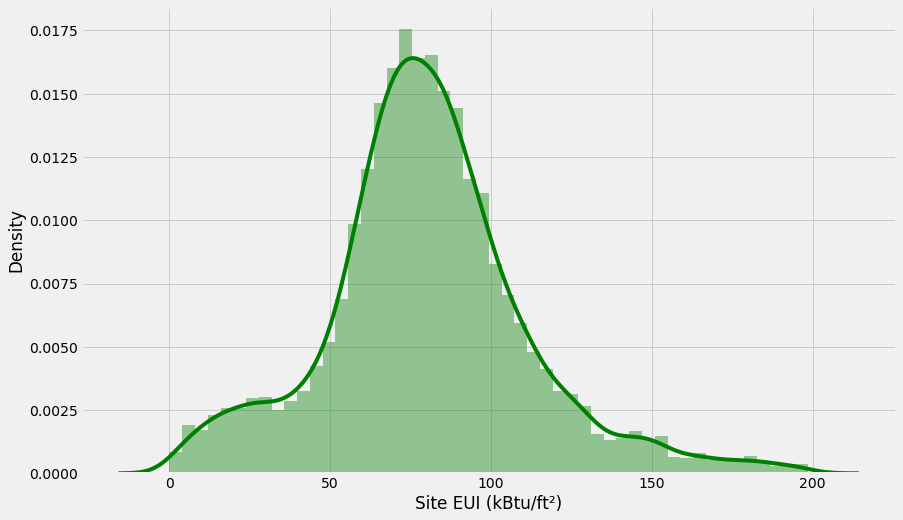

In [54]:
# Distribution Plot after removing outlier
plt.figure(figsize=(13,8))
sns.distplot(a=df['Site EUI (kBtu/ft²)'],color='g')

##### The distribution looks close to normal after removing outliers.

<Figure size 1080x1080 with 0 Axes>

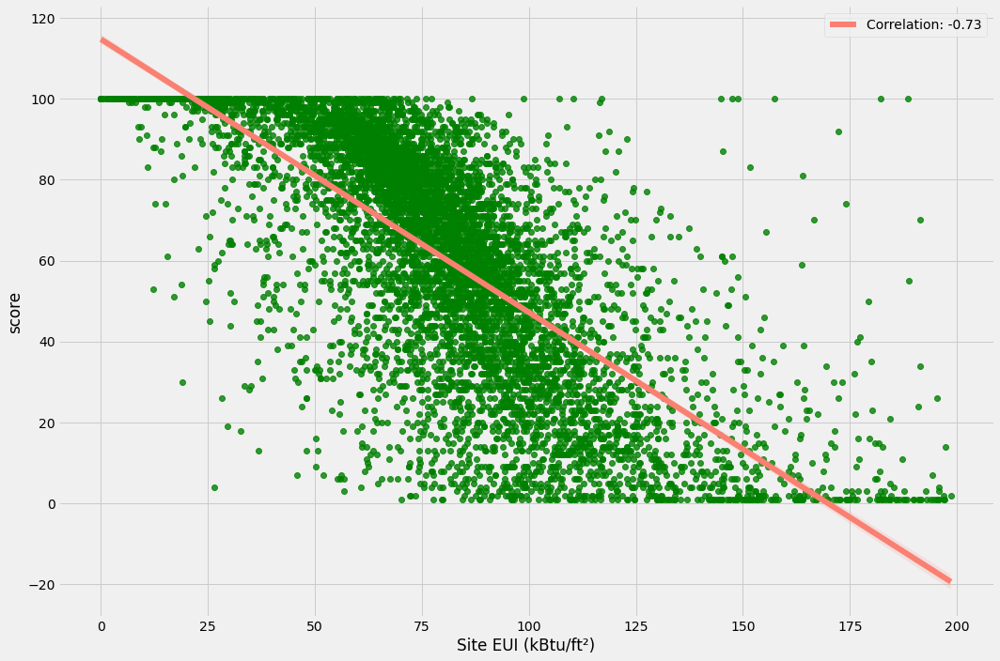

In [56]:
# relation between Site EUI and energy score after removing outlier

plt.figure(figsize=(15,15))
corr_coef = np.corrcoef(df['Site EUI (kBtu/ft²)'],df['score'])[0, 1]

sns.lmplot(data=df,x='Site EUI (kBtu/ft²)',y='score',scatter_kws={"color": "g"},line_kws=
           {"color": "salmon","label": f"Correlation: {df['Site EUI (kBtu/ft²)'].corr(df['score']):.2f}"},height=10, aspect=1.5)
plt.legend()
plt.show()

##### Before removing outliers the data looked random. Infact there was no correlation between Site EUI and energy score. But now we can clearly see a strong negative correlation of more than 0.7 in data.

In [57]:
df.shape

(7556, 28)

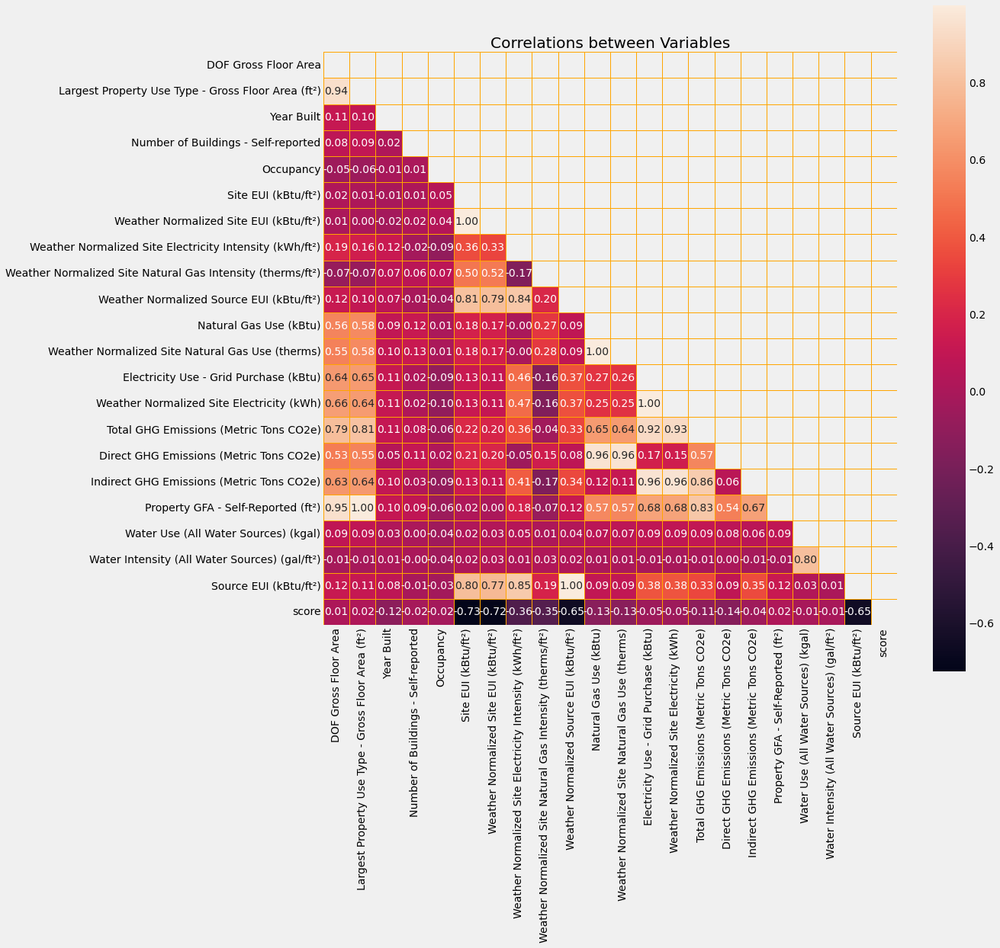

In [58]:
corr_df = df.corr()
f,ax=plt.subplots(figsize=(15,15))
mask = np.zeros_like(corr_df)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr_df,annot=True,fmt=".2f",ax=ax,linewidths=0.5,linecolor="orange", mask = mask, square=True)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.title('Correlations between Variables')
plt.show()

##### This looks much better. By removing outliers we are able to create a case for majority of data. Thus, many predictor variables are now showing strong correlations with score.

### Manually removing outliers

###### By removing outliers from other skewed features like Direct GHG Emissions and DOF Gross floor area we would be eliminating many useful datapoints. Thus we will remove extreme outliers here manually.

In [59]:
# function for scatter plot
def scatter(col1, col2):
    fig = px.scatter(df, x=col1, y=col2, color="score", template = 'plotly_dark')
    return fig.show()

In [60]:
scatter('DOF Gross Floor Area','Electricity Use - Grid Purchase (kBtu)')

##### There is linear relationship between DOF Gross Floor Area' and 'Electricity Use - Grid Purchase (kBtu). Some clear outliers are visible.

In [61]:
scatter('DOF Gross Floor Area','Natural Gas Use (kBtu)')

In [62]:
scatter('DOF Gross Floor Area','Direct GHG Emissions (Metric Tons CO2e)')

In [63]:
scatter('Direct GHG Emissions (Metric Tons CO2e)','Electricity Use - Grid Purchase (kBtu)')

In [64]:
scatter('Source EUI (kBtu/ft²)','Site EUI (kBtu/ft²)')

In [65]:
df.columns

Index(['Borough', 'DOF Gross Floor Area',
       'Primary Property Type - Self Selected', 'Largest Property Use Type',
       'Largest Property Use Type - Gross Floor Area (ft²)', 'Year Built',
       'Number of Buildings - Self-reported', 'Occupancy',
       'Metered Areas (Energy)', 'Metered Areas  (Water)',
       'Site EUI (kBtu/ft²)', 'Weather Normalized Site EUI (kBtu/ft²)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Weather Normalized Source EUI (kBtu/ft²)', 'Natural Gas Use (kBtu)',
       'Weather Normalized Site Natural Gas Use (therms)',
       'Electricity Use - Grid Purchase (kBtu)',
       'Weather Normalized Site Electricity (kWh)',
       'Total GHG Emissions (Metric Tons CO2e)',
       'Direct GHG Emissions (Metric Tons CO2e)',
       'Indirect GHG Emissions (Metric Tons CO2e)',
       'Property GFA - Self-Reported (ft²)',
       'Water Use (All Water Sources) (kgal)',
 

***Observation:***
- We will remove the lone outlier in Direct GHG Emissions. It looks like it can severly affect the model. 
-  We may want to eliminate outlier in DOF Floor area. But for most features it is following the pattern. So we will let it be.
- We will drop the lone outlier present in Electricty use and Natural gas use.

In [66]:
df.shape

(7556, 28)

In [67]:
df.describe()['Direct GHG Emissions (Metric Tons CO2e)']

count    7547.000000
mean      404.935511
std       977.339111
min         0.000000
25%       169.700000
50%       278.900000
75%       441.600000
max     63451.100000
Name: Direct GHG Emissions (Metric Tons CO2e), dtype: float64

In [68]:
#  dropping the lone outlier having direct GHG emission as ~63450
df.drop(index=df[df['Direct GHG Emissions (Metric Tons CO2e)']>60000].index,inplace=True)

In [69]:
df.describe()['Electricity Use - Grid Purchase (kBtu)']

count        7509.000000
mean      4779298.107151
std      12210201.209413
min             0.000000
25%       1014298.900000
50%       1732975.700000
75%       3934076.900000
max     381566953.700000
Name: Electricity Use - Grid Purchase (kBtu), dtype: float64

In [70]:
df[df['Electricity Use - Grid Purchase (kBtu)']==381566953.700000]

,Borough,DOF Gross Floor Area,Primary Property Type - Self Selected,Largest Property Use Type,Largest Property Use Type - Gross Floor Area (ft²),Year Built,Number of Buildings - Self-reported,Occupancy,Metered Areas (Energy),Metered Areas (Water),Site EUI (kBtu/ft²),Weather Normalized Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Weather Normalized Source EUI (kBtu/ft²),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Property GFA - Self-Reported (ft²),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Water Required?,score
3133,Manhattan,2963699.000000,Office,Office,2291626.000000,1939,1,95,Whole Building,Whole Building,119.000000,119.300000,38.100000,NaN,409.600000,NaN,NaN,381566953.700000,110916652.200000,35891.900000,0.000000,35891.900000,2911536,NaN,NaN,411.300000,No,26


In [71]:
df[df['Electricity Use - Grid Purchase (kBtu)']==381566953.700000]

,Borough,DOF Gross Floor Area,Primary Property Type - Self Selected,Largest Property Use Type,Largest Property Use Type - Gross Floor Area (ft²),Year Built,Number of Buildings - Self-reported,Occupancy,Metered Areas (Energy),Metered Areas (Water),Site EUI (kBtu/ft²),Weather Normalized Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Weather Normalized Source EUI (kBtu/ft²),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Property GFA - Self-Reported (ft²),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Water Required?,score
3133,Manhattan,2963699.000000,Office,Office,2291626.000000,1939,1,95,Whole Building,Whole Building,119.000000,119.300000,38.100000,NaN,409.600000,NaN,NaN,381566953.700000,110916652.200000,35891.900000,0.000000,35891.900000,2911536,NaN,NaN,411.300000,No,26


In [72]:
df.shape

(7555, 28)

In [73]:
(df['Natural Gas Use (kBtu)']).describe()

count        6786.000000
mean      6073666.740775
std      11892424.326649
min             0.000000
25%       1201150.000000
50%       4181450.100000
75%       6722444.100000
max     361225620.200000
Name: Natural Gas Use (kBtu), dtype: float64

The lone outlier present in Natural gas got eliminated during removal outliers from above features.

### Missing values treatment

In [74]:
# function to create df for missing data and correlation
def missing_corr_df(df):
    correlations_df = df.corr()['score'].sort_values()

    total = df.isnull().sum().sort_values(ascending=False)
    percent = round((df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)*100,2)
    missing_data = pd.concat([total[total>0], percent[percent>0]], axis=1, keys=['Total', 'Percent'])

    miss_corr_df = (pd.concat([correlations_df,missing_data],axis=1)).sort_values(by=['Percent','score'],ascending=False)
    return miss_corr_df

In [75]:
missing_corr_df(df)

,score,Total,Percent
Metered Areas (Water),NaN,2921.000000,38.660000
Water Intensity (All Water Sources) (gal/ft²),-0.008500,2399.000000,31.750000
Water Use (All Water Sources) (kgal),-0.009338,2399.000000,31.750000
Weather Normalized Site Natural Gas Use (therms),-0.170389,1082.000000,14.320000
Weather Normalized Site Natural Gas Intensity (therms/ft²),-0.346363,1082.000000,14.320000
Weather Normalized Source EUI (kBtu/ft²),-0.654017,834.000000,11.040000
Weather Normalized Site EUI (kBtu/ft²),-0.716614,834.000000,11.040000
Natural Gas Use (kBtu),-0.168842,769.000000,10.180000
Weather Normalized Site Electricity (kWh),-0.048290,353.000000,4.670000
Weather Normalized Site Electricity Intensity (kWh/ft²),-0.364492,353.000000,4.670000


In [76]:
corr_mat_triu = corr_df.where(np.triu(np.ones(corr_df.shape).astype(bool),1))
pos_cor = [cols for cols in corr_mat_triu.columns if any(corr_mat_triu[cols]>=0.9)]
neg_cor = [cols for cols in corr_mat_triu.columns if any(corr_mat_triu[cols]<=-0.9)]

In [77]:
for i in correlations_df.index:
    print(corr_mat_triu[corr_mat_triu>0.9][i][(corr_mat_triu[corr_mat_triu>0.9][i].values>0.9) & (corr_mat_triu[corr_mat_triu>0.9][i].values!=1.0)])
    print('-'*125)

Series([], Name: Site EUI (kBtu/ft²), dtype: float64)
-----------------------------------------------------------------------------------------------------------------------------
Site EUI (kBtu/ft²)   0.996499
Name: Weather Normalized Site EUI (kBtu/ft²), dtype: float64
-----------------------------------------------------------------------------------------------------------------------------
Series([], Name: Weather Normalized Source EUI (kBtu/ft²), dtype: float64)
-----------------------------------------------------------------------------------------------------------------------------
Weather Normalized Source EUI (kBtu/ft²)   0.998452
Name: Source EUI (kBtu/ft²), dtype: float64
-----------------------------------------------------------------------------------------------------------------------------
Series([], Name: Weather Normalized Site Electricity Intensity (kWh/ft²), dtype: float64)
-----------------------------------------------------------------------------------------

In [78]:
print('Number of positive corelated columns:',len(pos_cor))
print('Number of negatively corelated columns:',len(neg_cor))

Number of positive corelated columns: 9
Number of negatively corelated columns: 0


In [79]:
correlations_df

Site EUI (kBtu/ft²)                                          -0.726312
Weather Normalized Site EUI (kBtu/ft²)                       -0.716759
Weather Normalized Source EUI (kBtu/ft²)                     -0.654013
Source EUI (kBtu/ft²)                                        -0.647889
Weather Normalized Site Electricity Intensity (kWh/ft²)      -0.364492
Weather Normalized Site Natural Gas Intensity (therms/ft²)   -0.346820
Direct GHG Emissions (Metric Tons CO2e)                      -0.140322
Weather Normalized Site Natural Gas Use (therms)             -0.131913
Natural Gas Use (kBtu)                                       -0.130621
Year Built                                                   -0.116692
Total GHG Emissions (Metric Tons CO2e)                       -0.108719
Electricity Use - Grid Purchase (kBtu)                       -0.051135
Weather Normalized Site Electricity (kWh)                    -0.048290
Indirect GHG Emissions (Metric Tons CO2e)                    -0.043955
Occupa

In [80]:
pos_cor

['Largest Property Use Type - Gross Floor Area (ft²)',
 'Weather Normalized Site EUI (kBtu/ft²)',
 'Weather Normalized Site Natural Gas Use (therms)',
 'Weather Normalized Site Electricity (kWh)',
 'Total GHG Emissions (Metric Tons CO2e)',
 'Direct GHG Emissions (Metric Tons CO2e)',
 'Indirect GHG Emissions (Metric Tons CO2e)',
 'Property GFA - Self-Reported (ft²)',
 'Source EUI (kBtu/ft²)']

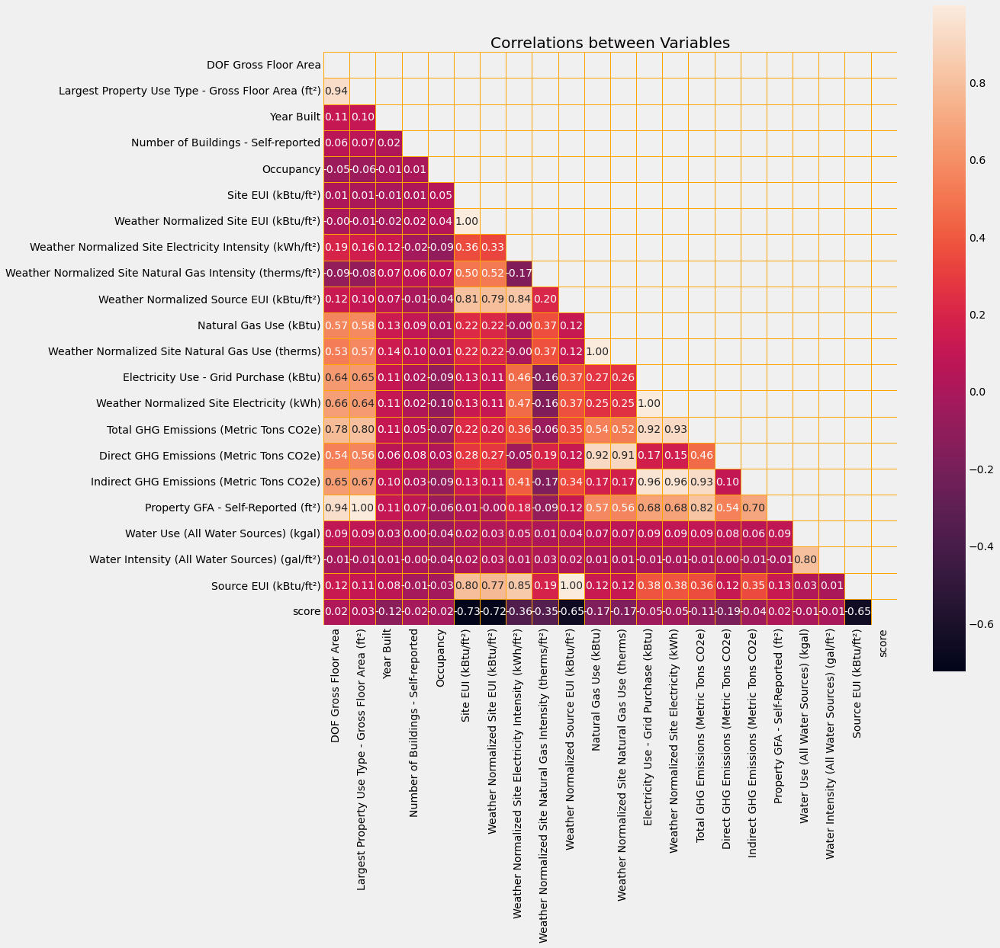

In [81]:
corr_df = df.corr()
f,ax=plt.subplots(figsize=(15,15))
mask = np.zeros_like(corr_df)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr_df,annot=True,fmt=".2f",ax=ax,linewidths=0.5,linecolor="orange", mask = mask, square=True)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.title('Correlations between Variables')
plt.show()

***We will drop those variables which have weak correlation with target variable score and has most data missing or have strong correlation between other predictor variables i.e multicolinearity check.***

- ***Water Intensity*** and ***Water use*** have weak correlation with Energy score.


- We will separate missing values of Energy score and consider it as a df whose value we will predict using our model.

-   Site EUI has strong correlation with
 - ***Weather Normalized Site EUI (kBtu/ft²)*** 
 - We are keeping Site EUI because it has better correlation with energy and has less missing value.

- Direct GHG Emissions (Metric Tons CO2e) 
 - ***Natural Gas Use (kBtu)*** and ***Weather Normalized Site Natural Gas Use (therms)*** has strong correlation with Direct GHG Emissions (Metric Tons CO2e).
 - Further We are keeping Direct GHG Emissions (Metric Tons CO2e) because it has better correlation with energy score as compared with above two variables.
 
- Total GHG Emissions (Metric Tons CO2e) - Grid Purchase (kBtu) but since it has strong correlation with
 - ***Weather Normalized Site Electricity (kWh), Electricity Use and Indirect GHG Emissions (Metric Tons CO2e)***
 - Further We are keeping Total GHG Emissions (Metric Tons CO2e) because it has better correlation with energy score as compared with above two variables.

- Source EUI (kBtu/ft²) has strong correlation with
 - ***Weather Normalized Source EUI (kBtu/ft²)***, we will drop this. Here there are 11% of missing data. It will be better if kept Source EUI.
 
- Largest Property Use Type - Gross Floor Area (ft²) has strong correlation with ***Property GFA - Self-Reported (ft²)***, so we will drop this.

###### But before dropping multicolinear columns we will impute missing values using the multicolinearity between these variables and KNN.  

In [82]:
missing_corr_df(df)

,score,Total,Percent
Metered Areas (Water),NaN,2921.000000,38.660000
Water Intensity (All Water Sources) (gal/ft²),-0.008500,2399.000000,31.750000
Water Use (All Water Sources) (kgal),-0.009338,2399.000000,31.750000
Weather Normalized Site Natural Gas Use (therms),-0.170389,1082.000000,14.320000
Weather Normalized Site Natural Gas Intensity (therms/ft²),-0.346363,1082.000000,14.320000
Weather Normalized Source EUI (kBtu/ft²),-0.654017,834.000000,11.040000
Weather Normalized Site EUI (kBtu/ft²),-0.716614,834.000000,11.040000
Natural Gas Use (kBtu),-0.168842,769.000000,10.180000
Weather Normalized Site Electricity (kWh),-0.048290,353.000000,4.670000
Weather Normalized Site Electricity Intensity (kWh/ft²),-0.364492,353.000000,4.670000


###### Lets impute categorical data first

In [83]:
col_distinguisher(df)

There are total 22 numerical columns.
 ['DOF Gross Floor Area', 'Largest Property Use Type - Gross Floor Area (ft²)', 'Year Built', 'Number of Buildings - Self-reported', 'Occupancy', 'Site EUI (kBtu/ft²)', 'Weather Normalized Site EUI (kBtu/ft²)', 'Weather Normalized Site Electricity Intensity (kWh/ft²)', 'Weather Normalized Site Natural Gas Intensity (therms/ft²)', 'Weather Normalized Source EUI (kBtu/ft²)', 'Natural Gas Use (kBtu)', 'Weather Normalized Site Natural Gas Use (therms)', 'Electricity Use - Grid Purchase (kBtu)', 'Weather Normalized Site Electricity (kWh)', 'Total GHG Emissions (Metric Tons CO2e)', 'Direct GHG Emissions (Metric Tons CO2e)', 'Indirect GHG Emissions (Metric Tons CO2e)', 'Property GFA - Self-Reported (ft²)', 'Water Use (All Water Sources) (kgal)', 'Water Intensity (All Water Sources) (gal/ft²)', 'Source EUI (kBtu/ft²)', 'score']
-----------------------------------------------------------------------------------------------------------------------------
Ther

In [84]:
col_cate

['Borough',
 'Primary Property Type - Self Selected',
 'Largest Property Use Type',
 'Metered Areas (Energy)',
 'Metered Areas  (Water)',
 'Water Required?']

In [85]:
(missing_corr_df(df)).loc[['Borough',
 'Metered Areas (Energy)',
 'Metered Areas  (Water)',
 'Water Required?']]

,score,Total,Percent
Borough,NaN,38.000000,0.500000
Metered Areas (Energy),NaN,2.000000,0.030000
Metered Areas (Water),NaN,2921.000000,38.660000
Water Required?,NaN,57.000000,0.750000


***Notes:***
- We will impute mode for Borough, Metered Areas (Energy) and Water Required?. Since less than 1% values are missing here.
- In case of Metered Areas (Water), we will check the distribution and decide method imputation.

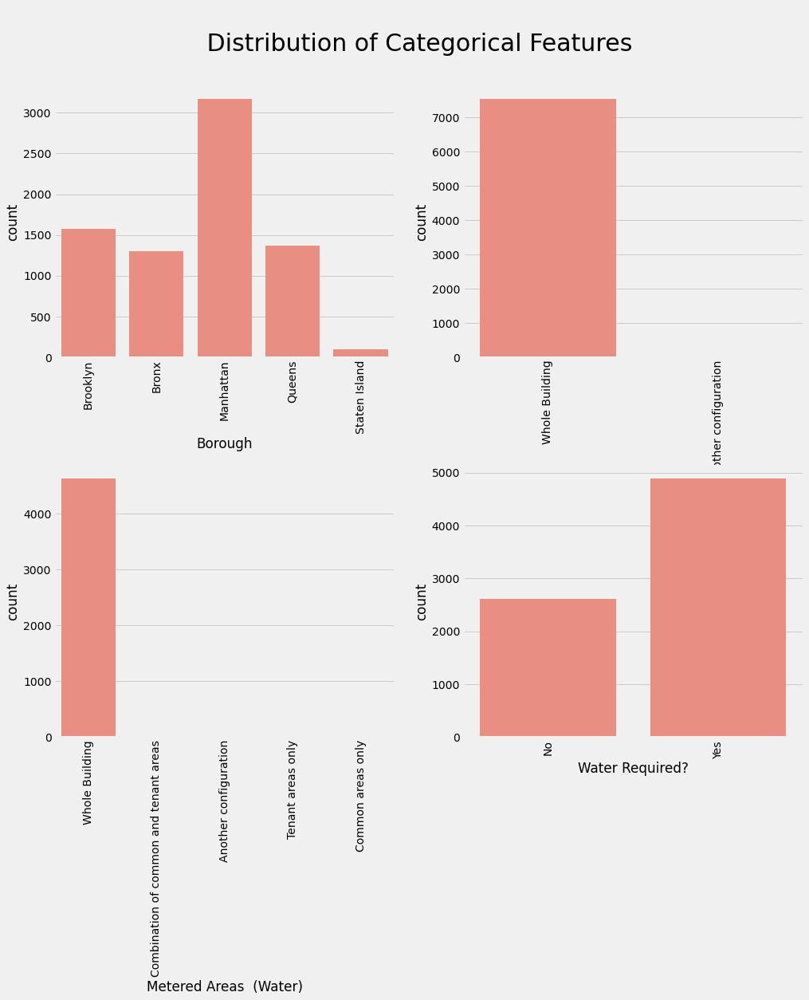

In [87]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,14))
fig.subplots_adjust(hspace=0.4)
fig.suptitle('\n Distribution of Categorical Features',fontsize=30)

for ax, col in zip(axes.flatten(), ['Borough','Metered Areas (Energy)','Metered Areas  (Water)',
                                     'Water Required?']):
    figur = sns.countplot(df[col], ax=ax,color='salmon')
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

##### We will impute with mode(Whole Building) for Metered Areas  (Water).

##### Technically we should check address and if present use that relation to fill the misisng data for Borough. But since missing values are less in number. We will impute mode.

In [88]:
df.columns

Index(['Borough', 'DOF Gross Floor Area',
       'Primary Property Type - Self Selected', 'Largest Property Use Type',
       'Largest Property Use Type - Gross Floor Area (ft²)', 'Year Built',
       'Number of Buildings - Self-reported', 'Occupancy',
       'Metered Areas (Energy)', 'Metered Areas  (Water)',
       'Site EUI (kBtu/ft²)', 'Weather Normalized Site EUI (kBtu/ft²)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Weather Normalized Source EUI (kBtu/ft²)', 'Natural Gas Use (kBtu)',
       'Weather Normalized Site Natural Gas Use (therms)',
       'Electricity Use - Grid Purchase (kBtu)',
       'Weather Normalized Site Electricity (kWh)',
       'Total GHG Emissions (Metric Tons CO2e)',
       'Direct GHG Emissions (Metric Tons CO2e)',
       'Indirect GHG Emissions (Metric Tons CO2e)',
       'Property GFA - Self-Reported (ft²)',
       'Water Use (All Water Sources) (kgal)',
 

In [89]:
df.drop(columns=['Number of Buildings - Self-reported'],inplace=True)
# critertia is related

In [90]:
from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

In [91]:
col_distinguisher(df)

There are total 21 numerical columns.
 ['DOF Gross Floor Area', 'Largest Property Use Type - Gross Floor Area (ft²)', 'Year Built', 'Occupancy', 'Site EUI (kBtu/ft²)', 'Weather Normalized Site EUI (kBtu/ft²)', 'Weather Normalized Site Electricity Intensity (kWh/ft²)', 'Weather Normalized Site Natural Gas Intensity (therms/ft²)', 'Weather Normalized Source EUI (kBtu/ft²)', 'Natural Gas Use (kBtu)', 'Weather Normalized Site Natural Gas Use (therms)', 'Electricity Use - Grid Purchase (kBtu)', 'Weather Normalized Site Electricity (kWh)', 'Total GHG Emissions (Metric Tons CO2e)', 'Direct GHG Emissions (Metric Tons CO2e)', 'Indirect GHG Emissions (Metric Tons CO2e)', 'Property GFA - Self-Reported (ft²)', 'Water Use (All Water Sources) (kgal)', 'Water Intensity (All Water Sources) (gal/ft²)', 'Source EUI (kBtu/ft²)', 'score']
-----------------------------------------------------------------------------------------------------------------------------
There are total 6 categorical columns.
 ['B

In [92]:
# temp df to check the effect of knn imputation
temp = df[col_num]

scaled = StandardScaler()
temp_scaled = scaled.fit_transform(temp)
temp_scaled = pd.DataFrame(temp_scaled,columns=temp.columns)
knn_imp  = KNNImputer(n_neighbors=8)
temp_knn = knn_imp.fit_transform(temp_scaled)
temp_knn = pd.DataFrame(temp_knn,columns=temp.columns)
temp_knn

,DOF Gross Floor Area,Largest Property Use Type - Gross Floor Area (ft²),Year Built,Occupancy,Site EUI (kBtu/ft²),Weather Normalized Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Weather Normalized Source EUI (kBtu/ft²),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Property GFA - Self-Reported (ft²),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),score
0,-0.018525,0.060916,0.383930,0.177216,2.386462,2.225864,1.145737,2.062443,1.980941,1.081208,1.164956,0.259951,0.230478,0.466571,0.933101,0.132301,0.042257,-0.012263,-0.015236,2.140400,-0.504234
1,-0.166367,-0.153914,-0.580716,0.177216,0.713841,0.824684,-0.816296,-1.355352,-0.109912,-0.482781,-0.503267,-0.304733,-0.307812,-0.038870,0.556022,-0.276469,-0.166505,-0.086463,-0.080638,-0.167188,-1.256510
2,0.022975,-0.343000,0.018030,0.177216,-0.443638,-0.415717,-1.085595,0.638362,-0.931931,-0.217881,-0.224911,-0.370951,-0.369515,-0.409671,-0.323268,-0.324386,-0.350250,-0.083293,-0.057016,-0.942099,1.273872
3,-0.345851,-0.345024,-0.281343,0.177216,-0.278284,-0.266013,-0.566233,-1.355352,-0.555667,-0.499502,-0.519500,-0.326341,-0.327810,-0.353011,-0.248708,-0.292058,-0.352217,-0.109224,-0.101515,-0.535785,0.384819
4,-0.332702,-0.400028,-2.776117,0.177216,1.903119,1.719850,6.474004,-1.355352,5.067962,-0.504257,-0.522868,0.346668,0.340556,-0.049301,-0.599660,0.195105,-0.321874,-0.113811,-0.119285,5.195470,-1.666842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7550,-0.311215,-0.316824,-0.780298,0.177216,0.176440,0.051725,-0.162285,0.353545,-0.077709,-0.121243,-0.149658,-0.269289,-0.268923,-0.309233,-0.230068,-0.250785,-0.299676,-0.065127,-0.018542,-0.004320,-0.675206
7551,-0.346814,-0.346049,0.716566,0.177216,-0.415019,-0.432139,-0.797060,0.246739,-0.670707,-0.243460,-0.218673,-0.346834,-0.346311,-0.403287,-0.348020,-0.306944,-0.353213,-0.124970,-0.144427,-0.734656,0.795151
7552,-0.298637,-0.294829,-0.314607,0.177216,0.825137,0.674980,-0.508526,1.207994,0.073136,0.029132,-0.002580,-0.305765,-0.305015,-0.278622,-0.084920,-0.277171,-0.303440,-0.093257,-0.075062,0.148262,-1.359093
7553,-0.118858,-0.103698,-0.214816,0.177216,-0.825225,-0.819000,-0.354641,-0.216087,-0.703122,-0.127304,-0.120871,-0.207566,-0.211587,-0.271554,-0.235874,-0.206126,-0.117707,-0.084462,-0.099391,-0.678081,0.726762


In [93]:
# function to plot distribution with and iwthout imputation by using both KNN and Median imputation
def distribution(feature):
    plt.figure(figsize=(18,10))
    fig.suptitle('Change in Distributions by KNN Imputation',fontsize=30)
    
    fig2 = sns.distplot(a=temp_scaled[feature],color='lightblue',kde_kws={'lw':8},label='Without Imptation')
    fig2 = sns.distplot(a=temp_knn[feature],color='salmon',kde_kws={'lw':2},label='Imputation by KNN')
    
    fig2=fig2.legend(loc='best', fontsize=20)
    
    plt.show()

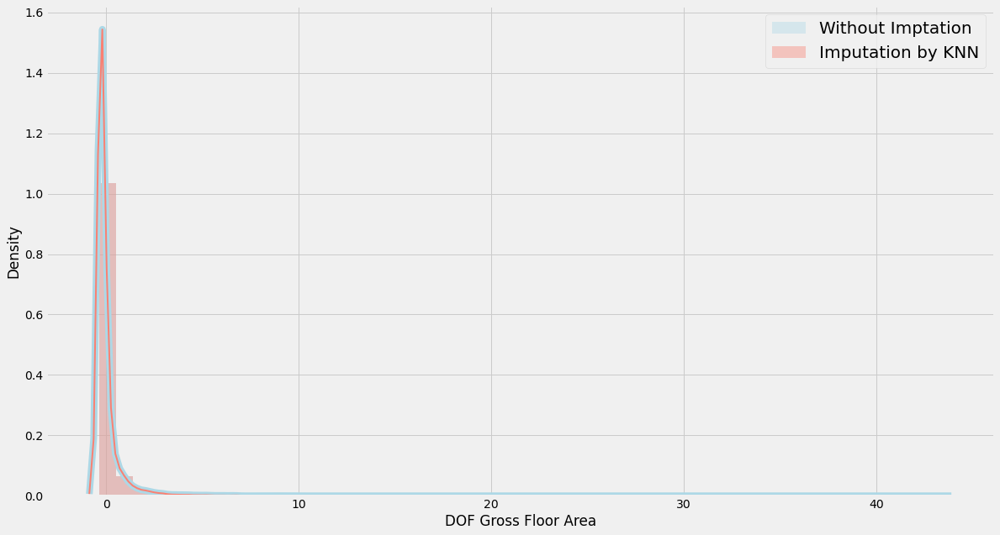

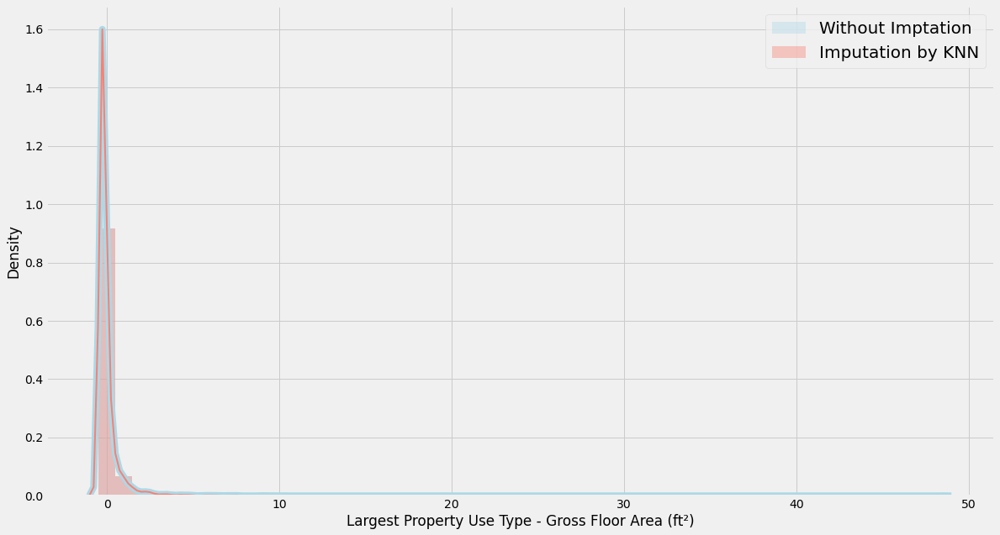

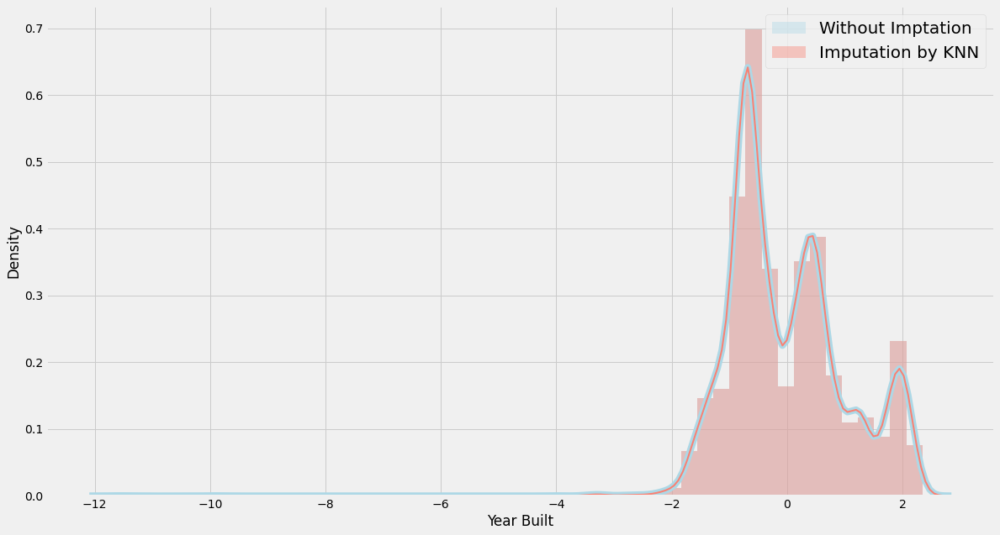

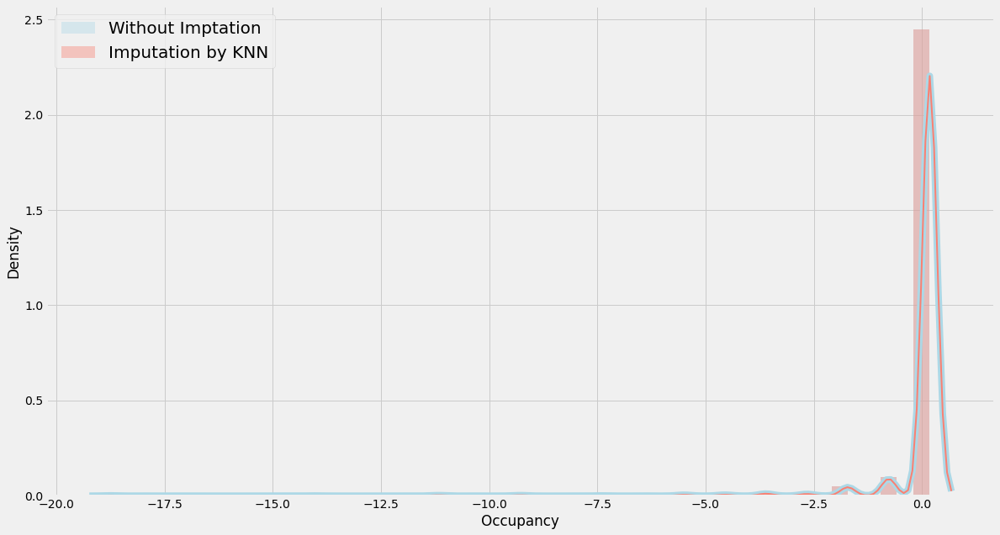

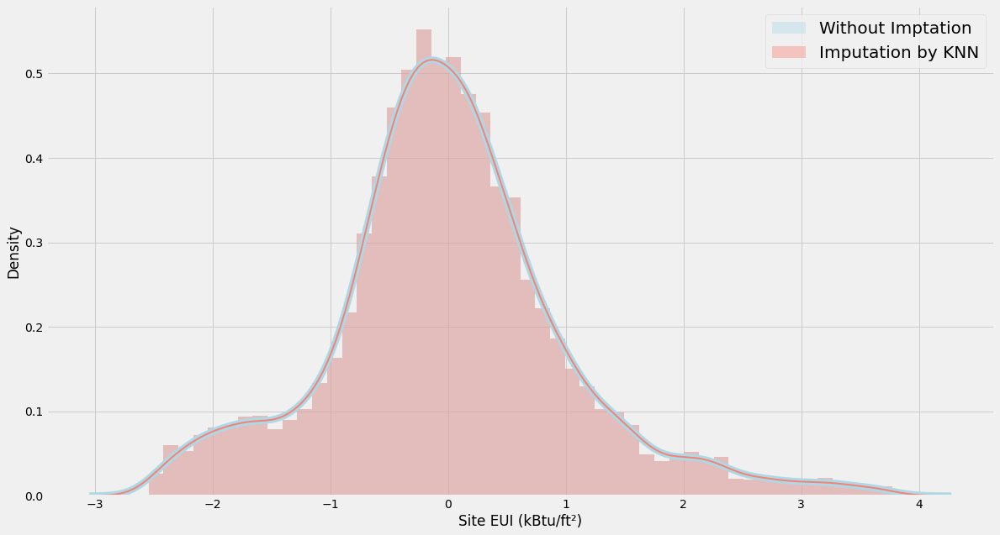

...

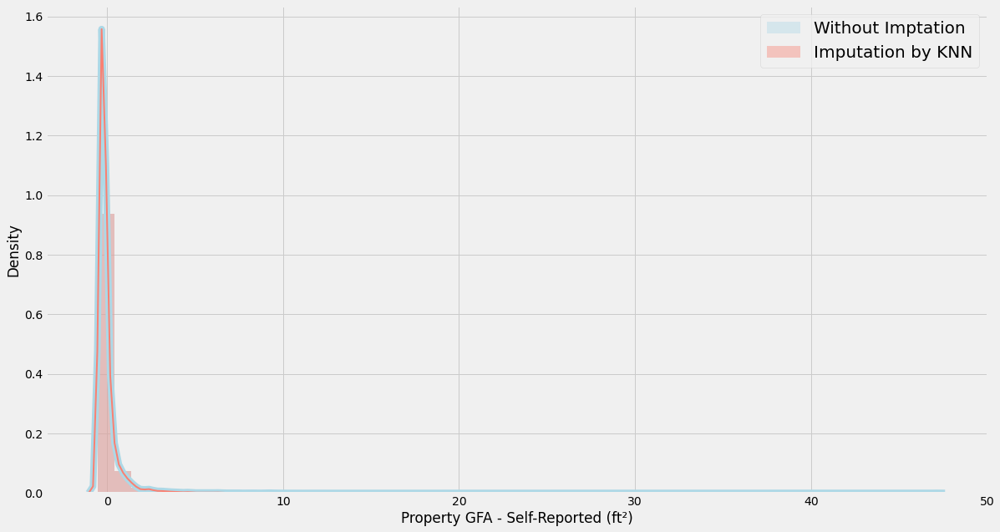

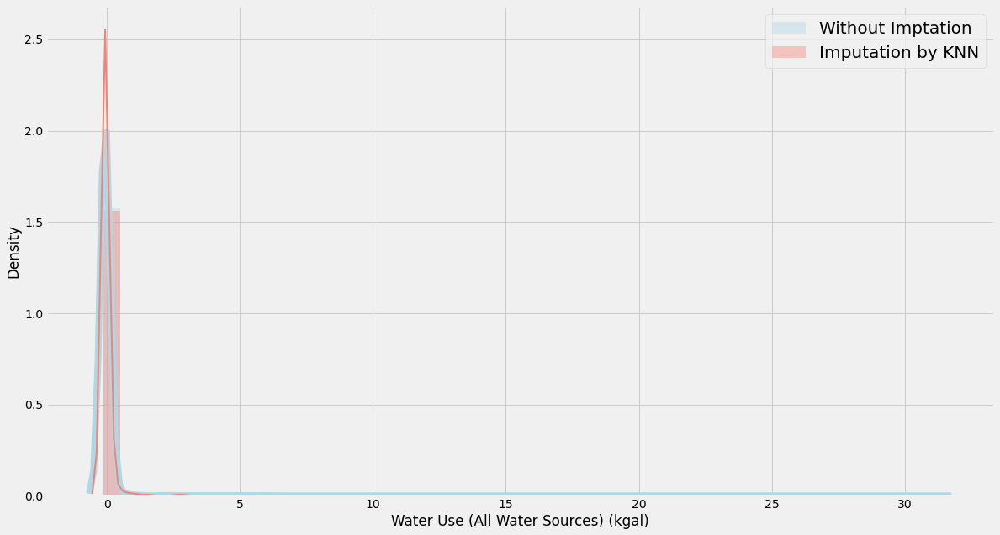

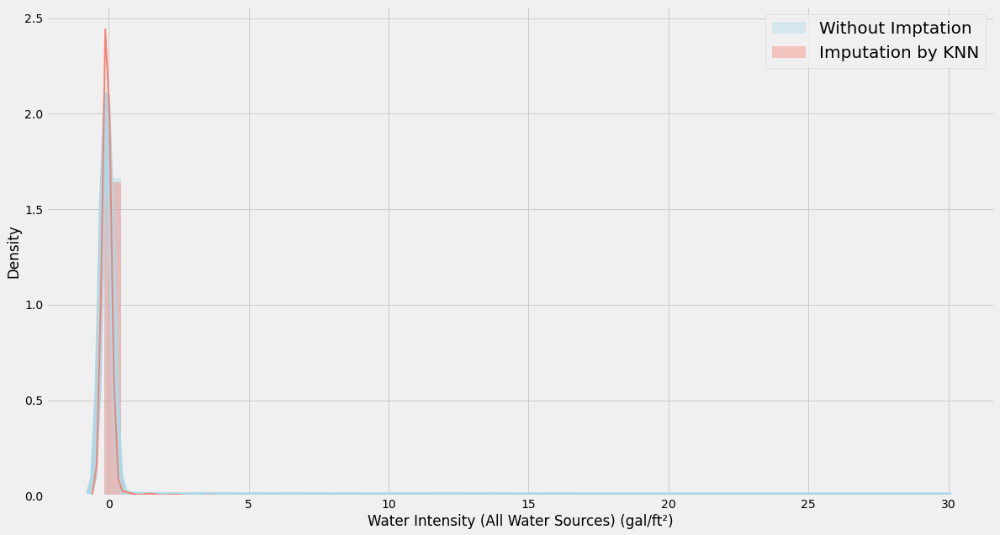

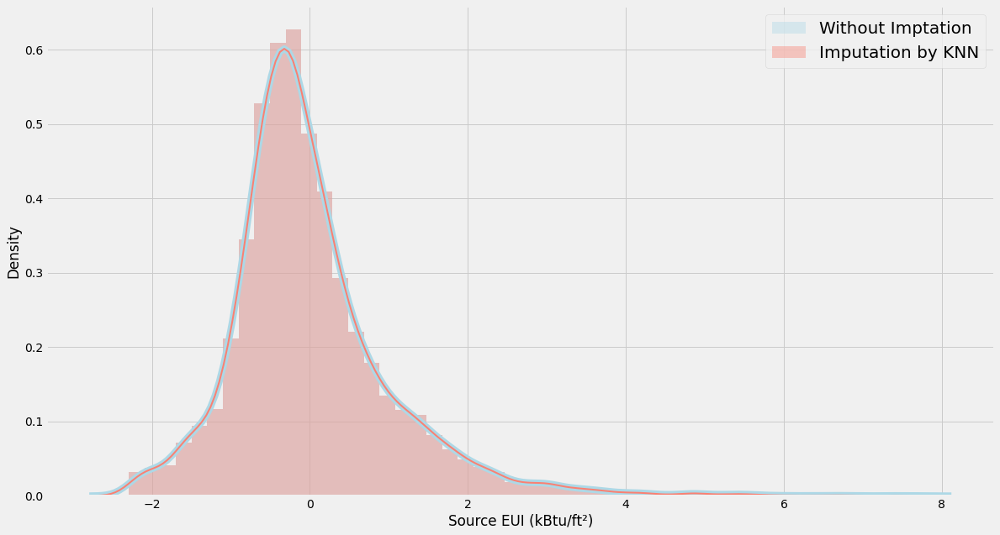

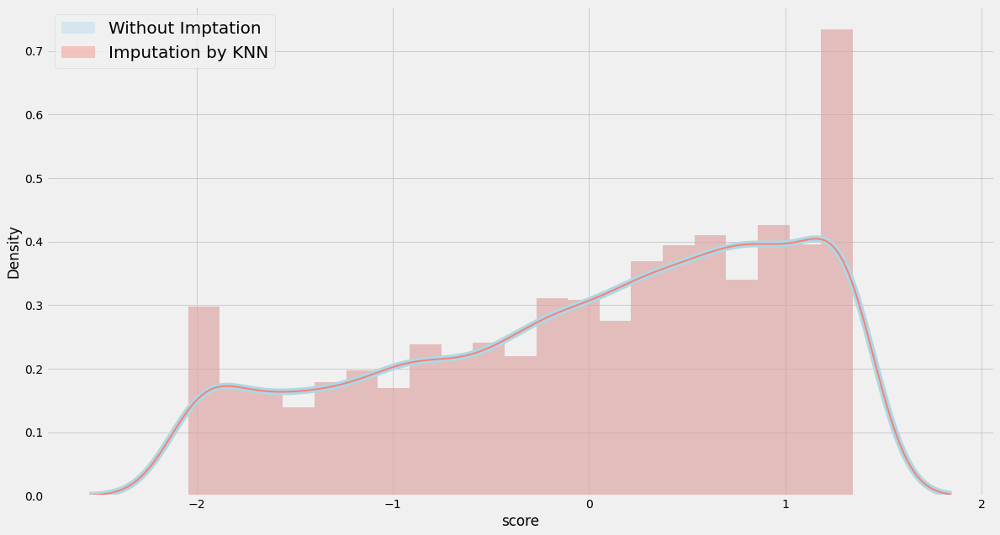

In [94]:
for i in col_num:
    distribution(i)

##### Baring a few which are slightly out. All distribution looks good. We will proceed with KNN.

In [95]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

In [96]:
# seprating predictor and targte variable
X_train = df.drop(columns='score')
y_train = df['score']

In [97]:
col_num.remove('score')

###### Numerical col

In [98]:
# scaling data before knn imputation
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train[col_num])
X_test_scaled = scaler.transform(X_test[col_num])

X_train_scaled = pd.DataFrame(X_train_scaled,columns=col_num)
X_test_scaled = pd.DataFrame(X_test_scaled,columns=col_num)

In [99]:
# imputing the misisng values
knn_imp = KNNImputer(n_neighbors=8)
X_train_imputed = knn_imp.fit_transform(X_train_scaled)
X_test_imputed = knn_imp.transform(X_test_scaled)

X_train_imputed = pd.DataFrame(X_train_imputed,columns=col_num)
X_test_imputed = pd.DataFrame(X_test_imputed,columns=col_num)

###### Categorical col

In [100]:
mode_imp = SimpleImputer(strategy='most_frequent')

In [101]:
X_train_mode = mode_imp.fit_transform(X_train[col_cate])
X_test_mode = mode_imp.transform(X_test[col_cate])

In [102]:
ohe = OneHotEncoder(drop='first',sparse=False,handle_unknown='ignore')

ohe.fit(X_train_mode)
col_cate_encoded = ohe.get_feature_names_out(col_cate)

X_train_encoded = ohe.transform(X_train_mode)
X_train_encoded = pd.DataFrame(X_train_encoded,columns=col_cate_encoded)

X_test_encoded = ohe.transform(X_test_mode)
X_test_encoded = pd.DataFrame(X_test_encoded,columns=col_cate_encoded)

In [103]:
X_train = pd.concat([X_train_imputed,X_train_encoded],axis=1)
X_test = pd.concat([X_test_imputed,X_test_encoded],axis=1)

In [104]:
X_train.shape, X_test.shape

((7555, 69), (1929, 69))

In [105]:
missing_count(X_train)

,Total,Percent


In [106]:
missing_count(X_test)

,Total,Percent


In [107]:
multicolinear_columns

['Weather Normalized Site EUI (kBtu/ft²)',
 'Natural Gas Use (kBtu)',
 'Weather Normalized Site Electricity (kWh)',
 'Weather Normalized Site Natural Gas Use (therms)',
 'Indirect GHG Emissions (Metric Tons CO2e)',
 'Electricity Use - Grid Purchase (kBtu)',
 'Weather Normalized Source EUI (kBtu/ft²)',
 'Property GFA - Self-Reported (ft²)']

In [108]:
X_train.drop(columns=multicolinear_columns,inplace=True)
X_test.drop(columns=multicolinear_columns,inplace=True)

# Model Building

In [109]:
from sklearn.metrics import r2_score,mean_absolute_error, make_scorer
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

### Decision Tree

In [131]:
# decision tree parameters for grid search cv
param = {
    'max_depth' : [3, 5, 7, 10],
    'splitter' : ['best', 'random'],
    'min_samples_leaf' : [2, 3, 5, 7],
    'min_samples_split' : [2, 3, 5, 7],
    'max_features' : ['auto', 'sqrt', 'log2']
}

#decision tree object instantiation
dt = DecisionTreeRegressor(random_state=42)

# Grid search CV object instantiation
gscv = GridSearchCV(estimator=dt,param_grid=param,cv = 10,verbose=1,scoring='neg_mean_absolute_error')

# Fitting data to Grid search CV object
gscv.fit(X_train,y_train)

# Predicting target variable
y_pred_dt = gscv.predict(X_test)

Fitting 10 folds for each of 384 candidates, totalling 3840 fits


In [132]:
print('Best Parameters:\n',gscv.best_params_)

Best Parameters:
 {'max_depth': 7, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 7, 'splitter': 'best'}


In [110]:
# fitting best parameters to decision tree classifier for prediction
dt = DecisionTreeRegressor(max_depth=7,max_features='auto',
                            min_samples_leaf=2,min_samples_split=7,
                           splitter='best',random_state=42)
dt.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=7, max_features='auto', min_samples_leaf=2,
                      min_samples_split=7, random_state=42)

In [115]:
# Cross validated Mean Absolute Errors for train and test set
# Set up the MAE scoring metric
mae_scorer = make_scorer(mean_absolute_error)
# MAE
mae_train = cross_val_score(dt, X_train, y_train, cv=10,scoring=mae_scorer)
mae_test = cross_val_score(dt, X_test, y_test, cv=10,scoring=mae_scorer)

# Mean of 10 fold cross validated score
mae_dt_train = np.mean(mae_train)
mae_dt_test = np.mean(mae_test)

print('Mean Absolute Error for the Decision Tree model on train data is:',mae_dt_train)
print('Mean Absolute Error for the Decision Tree model on test data is:',mae_dt_test)

Mean Absolute Error for the Decision Tree model on train data is: 9.430056431249776
Mean Absolute Error for the Decision Tree model on test data is: 10.693573164491582


###  Gradient Boosting 

In [113]:
gb=GradientBoostingRegressor(loss='lad', max_depth=5,  
                          max_features=None,
                          min_samples_leaf=6,
                          min_samples_split=6,
                          n_estimators=500)

gb.fit(X_train, y_train)


GradientBoostingRegressor(loss='lad', max_depth=5, min_samples_leaf=6,
                          min_samples_split=6, n_estimators=500)

In [114]:
# Cross validated Mean Absolute Error for train and test set

# Set up the MAE scoring metric
mae_scorer = make_scorer(mean_absolute_error)

# MAE
mae_train = cross_val_score(gb, X_train, y_train, cv=10,scoring=mae_scorer)
mae_test = cross_val_score(gb, X_test, y_test, cv=10,scoring=mae_scorer)

# Mean of 10 fold cross validated score
mae_gb_train = np.mean(mae_train)
mae_gb_test = np.mean(mae_test)

print('Mean Absolute Error for the Gradient Boosting model on train data is:',mae_gb_train)
print('Mean Absolute Error for the Gradient Boosting model on test data is:',mae_gb_test)

Accuracy score for the Gradient Boosting model on train data is: 8.637280027788982
Accuracy score for the Gradient Boosting model on test data is: 9.785633317416433


In [116]:
# predictions on test set
y_pred_gb = gb.predict(X_test)

# predictions on train set
y_true_gb = gb.predict(X_train)

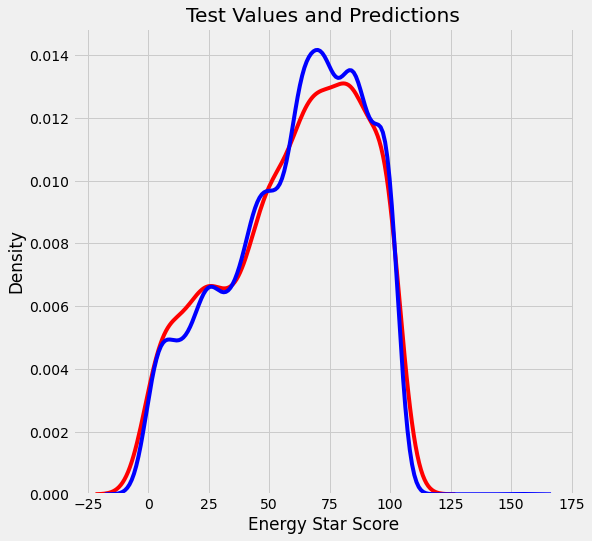

In [120]:
plt.figure(figsize=(8, 8))

# Density plot of the final predictions and the test values
sns.kdeplot(y_pred_gb, label = 'Predictions',color='r')
sns.kdeplot(y_true_gb, label = 'Values',color='b')

# Label the plot
plt.xlabel('Energy Star Score'); plt.ylabel('Density');
plt.title('Test Values and Predictions');

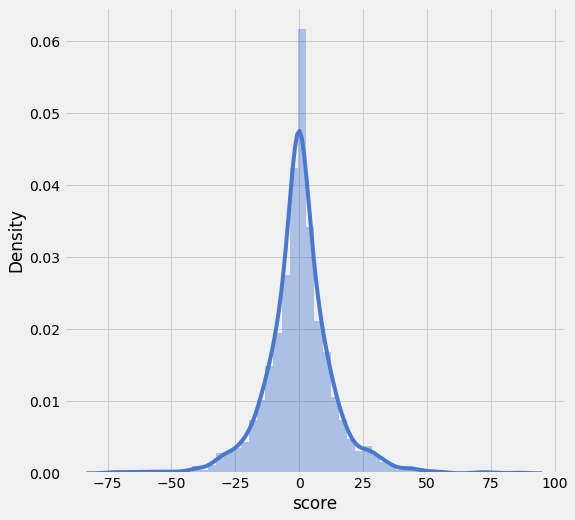

In [136]:
# distribution of residual
plt.figure(figsize=(8, 8))
sns.distplot(y_test-y_pred_gb, kde = True)
plt.show()

##### Distribution of residual looks normal.

##### To be continued....

- Compare results with other models
- Do feature analysis
- Write conclusion